# Production Diagnostic Plots
### Generate log-log rate vs MBT plots to identify flow regimes
### Generate decline rate derivative plots to identify terminal decline

#### Import libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.ticker as tick
import warnings

In [2]:
# Make tables and plots look pretty
pd.set_option('float_format', '{:,.1f}'.format)
sns.set(font='Lora', font_scale=1)
sns.set_style('whitegrid', {'axes.grid' : False})
sns.set_palette('husl')
mpl.rcParams['figure.dpi']= 300

#### Load data

Using gas wells in the Piceance basin with at least 10 years of production history

In [3]:
df = pd.read_csv('production.csv')
df['Date'] = pd.to_datetime(df['Date'])
print('Data loaded.\n')
df.info()
df.head()

Data loaded.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418643 entries, 0 to 418642
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Identifier  418643 non-null  object        
 1   Date        418643 non-null  datetime64[ns]
 2   Gas         418638 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 9.6+ MB


,Identifier,Date,Gas
0,051239,2011-01-31,"2,074.0"
1,051239,2011-02-28,"1,833.2"
2,051239,2011-03-31,"2,083.4"
3,051239,2011-04-30,"1,900.3"
4,051239,2011-05-31,"1,967.3"


#### Add time normalization

In [4]:
df.sort_values(by=['Identifier', 'Date'], inplace=True)
time_on_list = []
for i in df['Identifier'].unique():
    temp_array = np.arange(1, len(df[df['Identifier'] == i])+1)
    time_on_list.append(temp_array)
time_on = np.concatenate(time_on_list)
df['time_on'] = time_on
df.head()

,Identifier,Date,Gas,time_on
253542,050433,2011-10-31,501.8,1
253543,050433,2011-11-30,"1,044.8",2
253544,050433,2011-12-31,145.8,3
253545,050433,2012-01-31,25.4,4
253546,050433,2012-02-29,"2,542.1",5


#### Define unique well identifier, production type, and time step and store in dictionary with dataframe

In [5]:
data_dict = {
    'df': df,
    'well_id':  'Identifier',
    'major':    'Gas',
    'timestep': 'time_on'
}

print('Using', len(data_dict['df'][data_dict['well_id']].unique()), 'unique wells in analysis.')

Using 3000 unique wells in analysis.


#### Define simulation parameters

In [6]:
param_dict = {
    'num_trials':       10000,      # set number of simulation trials
    'sample_size':      4,     # set aggregation size, the number of properties to use to calculate the average forecast
    'num_timesteps':    120      # set the number of timesteps of production to use.
}

#### Simulation function
Takes the data dictionary and parameter dictionary and returns a numpy array with shape (num_trials, num_timesteps). For each trial, randomly selects with replacement well_id's equal to sample_size, averages the production of the sample set, and appends to the array.

In [7]:
def run_sim(data_dict, param_dict):
    '''
    Randomly select a set of wells equal to sample_size, calculate the average curve, 
    and add to array of size (num_trials, num_months)
    '''
    fcst_results = np.zeros((param_dict['num_trials'], param_dict['num_timesteps']))
    for trial in range(param_dict['num_trials']):
        samples = np.random.choice(data_dict['df'][data_dict['well_id']].unique(),
                                   replace=True, size=param_dict['sample_size'])
        mean_fcst = data_dict['df'][data_dict['df'][data_dict['well_id']].isin(
            samples)].groupby(by=[data_dict['timestep']])[data_dict['major']].mean()
        mean_fcst = np.array(mean_fcst)
        # If length of the average forecast is less than the desired number of timesteps, 
        # then append nans to the end of the series.
        if len(mean_fcst) < param_dict['num_timesteps']:
            mean_fcst = np.concatenate([mean_fcst, np.empty(param_dict['num_timesteps']-len(mean_fcst))*np.nan])
            
        # Replace any zero values with the average of the surrounding values
        zero_values = np.where(mean_fcst<0.001)[0]
        if len(zero_values) > 0:
            for _, val in enumerate(zero_values):
                if val < 5:
                    min_val = val
                else:
                    min_val = 5
                if val > len(mean_fcst) - 5:
                    max_val = len(mean_fcst) - val
                else:
                    max_val = 5
                avg_sample = np.concatenate([mean_fcst[val-min_val:val-1], mean_fcst[val+1:val+max_val]])
                new_val = np.mean(avg_sample)
                mean_fcst[val] = new_val
        fcst_results[trial, :] = mean_fcst[:param_dict['num_timesteps']]

    return fcst_results

In [8]:
np.warnings.filterwarnings('ignore')

sim_results = run_sim(data_dict, param_dict)
print('Number of trials ran:', param_dict['num_trials'])
print('Max number of timesteps returned:', param_dict['num_timesteps'])
print('Simulation output array shape:', sim_results.shape)

Number of trials ran: 10000
Max number of timesteps returned: 120
Simulation output array shape: (10000, 120)


Text(0.5, 0, 'Months on production')

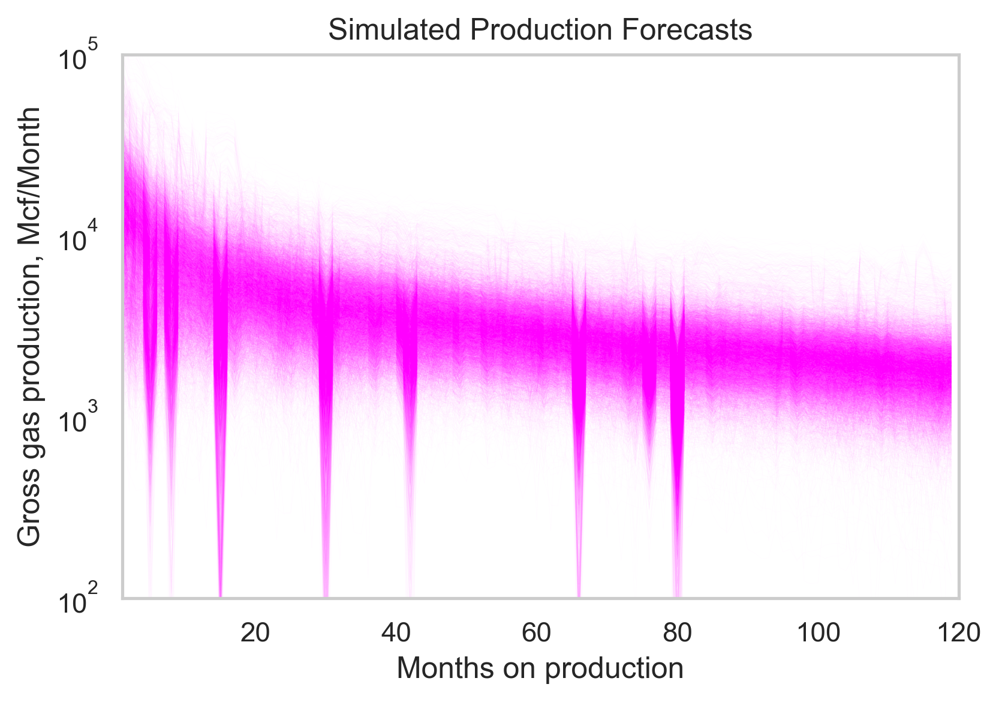

In [9]:
for i in range(sim_results.shape[0]):
    plt.semilogy(sim_results[i, :], lw=0.15, alpha=0.02, color='magenta')
plt.xlim(1, 120)
plt.ylim(100, 100000)
plt.title('Simulated Production Forecasts')
plt.ylabel('Gross gas production, Mcf/Month')
plt.xlabel('Months on production')

#### Helper Functions
Calculate material balance time, derivatives, and decline rates

In [10]:
def mbt(x):
    return x.cumsum()/x

In [11]:
def deriv(x, y):
    dy = np.zeros(y.shape, np.float)
    with np.errstate(divide='ignore'):
        dy[0:-1] = np.diff(y)/np.diff(x)
        dy[-1] = ((y[-1]-y[-2])/(x[-1]-x[-2]))
    dy[np.isinf(dy)] = np.nan
    return dy

In [12]:
def decline_rate(x, step=1):
    x_decline = np.zeros(x.shape)
    x_decline[step:] = (x[step:] - x[:-step])/x[:-step]
    x_decline[x_decline > 1] = np.nan
    x_decline[x_decline < -1] = np.nan
    return x_decline

In [13]:
def generate_mbt_df(sim_results):
    num_timesteps = sim_results.shape[1]
    rate_unrolled = sim_results.flatten()
    mbt_array = np.zeros(rate_unrolled.shape)
    time_array = np.zeros(rate_unrolled.shape)
    cumulative_prod_array = np.zeros(rate_unrolled.shape)
    time_range = np.arange(1, num_timesteps+1)
    for i, x in enumerate(sim_results):
        mbt_array[i*num_timesteps:i*num_timesteps+num_timesteps] = mbt(x)
        time_array[i*num_timesteps:i*num_timesteps+num_timesteps] = time_range
        cumulative_prod_array[i*num_timesteps:i*num_timesteps+num_timesteps] = x.cumsum()
    mbt_df = pd.DataFrame()
    mbt_df['rate'] = pd.Series(rate_unrolled)
    mbt_df['timestep'] = pd.Series(time_array)
    mbt_df['mbt'] = pd.Series(mbt_array)
    mbt_df['cumulative_prod'] = pd.Series(cumulative_prod_array)
    return mbt_df
mbt_df = generate_mbt_df(sim_results)

#### Derivative of log(rate) vs log(MBT)

In [14]:
def deriv_lograte_logmbt(sim_results, max_mbt=10):
    deriv_mbt_results = np.zeros([2, sim_results.ravel().shape[0]])
    for i, x in enumerate(sim_results):
        log_x = np.log1p(mbt(x))
        log_y = np.log1p(x)
        dy = deriv(log_x, log_y)
        kernel_size = 3
        kernel = np.ones(kernel_size) / kernel_size
        dy_conv = np.convolve(dy, kernel, mode='same')
        deriv_mbt_results[0, i*len(x):i*len(x)+len(x)] = log_x
        deriv_mbt_results[1, i*len(x):i*len(x)+len(x)] = dy_conv
    deriv_mbt_results = deriv_mbt_results[:, deriv_mbt_results[0] < max_mbt]
    return deriv_mbt_results
deriv_mbt_results = deriv_lograte_logmbt(sim_results)
print('Derivative MBT output array shape:', deriv_mbt_results.shape)
print('(log(MBT), d(log(rate))/d(log(MBT)))')

Derivative MBT output array shape: (2, 1199971)
(log(MBT), d(log(rate))/d(log(MBT)))


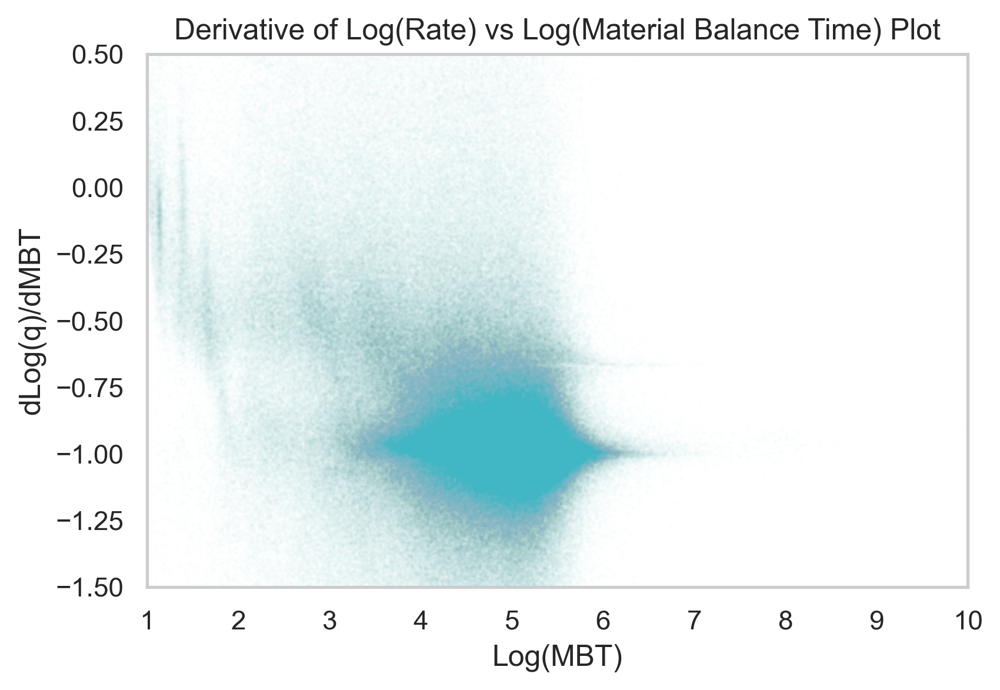

In [33]:
def dq_vs_mbt(deriv_mbt_results, x_label='Log(MBT)',
              y_label='dLog(q)/dMBT',
              plot_title='Derivative of Log(Rate) vs Log(Material Balance Time) Plot'):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    plt.scatter(deriv_mbt_results[0], deriv_mbt_results[1], color='#41b6c4', alpha=0.01, s=.1)
    ax.set_ylim(-1.5, 0.5)
    ax.set_xlim(1, 10)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(plot_title)
dq_vs_mbt(deriv_mbt_results)

In [16]:
def deriv_mbt_range(deriv_mbt_results, mbt_step=0.01, probs=[10, 50, 90]):
    mbt_range = np.arange(0, max(deriv_mbt_results[0]), mbt_step)
    deriv_mbt_range_array = np.zeros((len(probs), len(mbt_range)))
    deriv_mbt_nonan = deriv_mbt_results[:, ~np.isnan(deriv_mbt_results[0])]
    for idx, mbt in enumerate(mbt_range):
        if idx == 0:
            continue
        else:
            deriv_subset = deriv_mbt_nonan[1, np.where(
                (deriv_mbt_nonan[0]<=mbt) & (deriv_mbt_nonan[0]>mbt-mbt_step))][0]
            deriv_subset = deriv_subset[~np.isnan(deriv_subset)]
            if len(deriv_subset) == 0:
                deriv_mbt_range_array[:, idx] = np.nan
            else:
                deriv_mbt_range_array[:, idx] = np.percentile(deriv_subset, probs)
    return np.array([mbt_range, deriv_mbt_range_array])
deriv_mbt_range_array = deriv_mbt_range(deriv_mbt_results, mbt_step=0.1, probs=[10, 50, 90])
print('Returned array shape:', deriv_mbt_range_array.shape)
print('Returned array idx 0 contains MBT range with shape:', deriv_mbt_range_array[0].shape)
print('Returned array idx 1 contains Derivative MBT probabilities with shape:', deriv_mbt_range_array[1].shape)
print('(probabilities for d(log(rate))/d(log(MBT)))')

Returned array shape: (2,)
Returned array idx 0 contains MBT range with shape: (100,)
Returned array idx 1 contains Derivative MBT probabilities with shape: (3, 100)
(probabilities for d(log(rate))/d(log(MBT)))


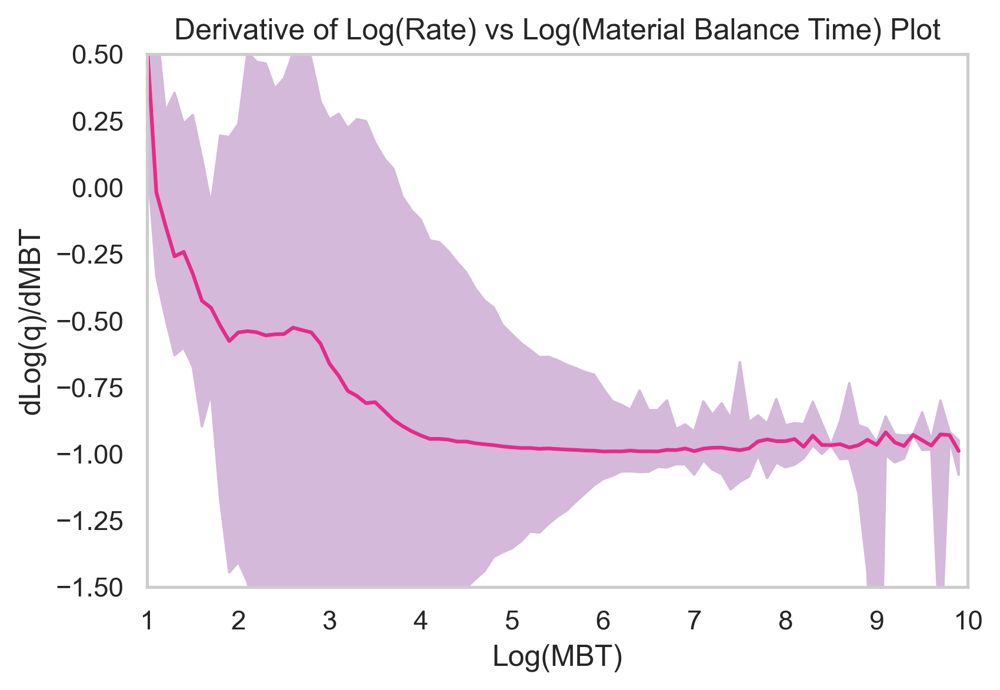

In [17]:
def dq_vs_mbt_range(deriv_mbt_range_array, x_label='Log(MBT)',
              y_label='dLog(q)/dMBT',
              plot_title='Derivative of Log(Rate) vs Log(Material Balance Time) Plot'):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    plt.fill_between(deriv_mbt_range_array[0], deriv_mbt_range_array[1][0, :], deriv_mbt_range_array[1][2, :], alpha=1.0, color='#d4b9da')
    plt.plot(deriv_mbt_range_array[0], deriv_mbt_range_array[1][1, :], color='#e7298a')
    ax.set_ylim(-1.5, 0.5)
    ax.set_xlim(1, 10)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(plot_title)
dq_vs_mbt_range(deriv_mbt_range_array)

In [18]:
def mbt_prob(deriv_mbt_results, mbt_step=0.1):
    mbt_range = np.arange(0, max(deriv_mbt_results[0]), mbt_step)
    mbt_prob_array = np.zeros(len(mbt_range))
    for idx, mbt in enumerate(mbt_range):
        if idx == 0:
            continue
        else:
            deriv_subset = deriv_mbt_results[1, np.where(
                (deriv_mbt_results[0]<=mbt) & (deriv_mbt_results[0]>mbt-mbt_step))][0]
            unit_slope = sum(deriv_subset <= -0.9)
            if len(deriv_subset) == 0:
                mbt_prob_array[idx] = np.nan
            else:
                mbt_prob_array[idx] = unit_slope / len(deriv_subset)
    return np.array([mbt_range, mbt_prob_array])
mbt_prob_array = mbt_prob(deriv_mbt_results)
print('Probability output array shape:', mbt_prob_array.shape)
print('(MBT, Probability of unit slope)')

Probability output array shape: (2, 100)
(MBT, Probability of unit slope)


P50 MBT: 3.9
P85 MBT: 6.4
P90 MBT: 6.5


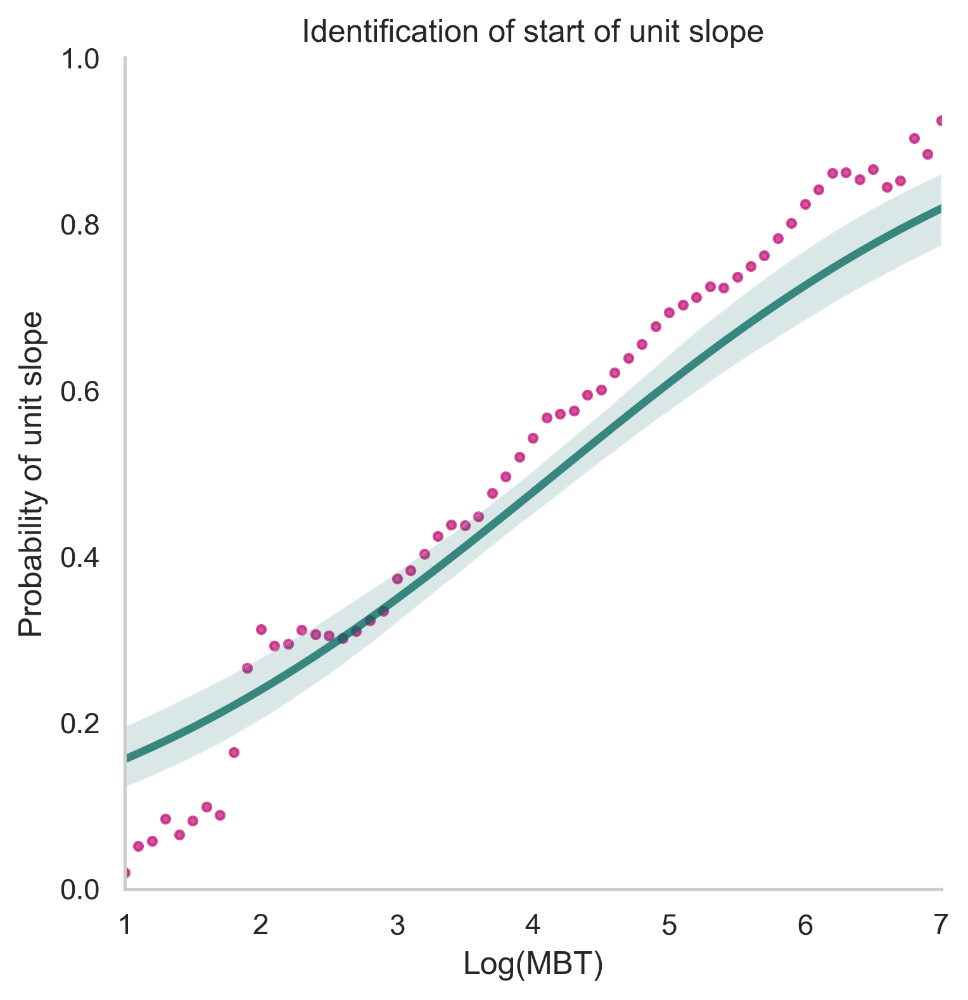

In [19]:
def plot_mbt_prob(mbt_prob_array, x_label='Log(MBT)', y_label='Probability of unit slope',
                  plot_title='Identification of start of unit slope'):
    plot_df = pd.DataFrame()
    plot_df['x'] = mbt_prob_array[0]
    plot_df['y'] = mbt_prob_array[1]
    plot = sns.lmplot(x='x', y='y', data=plot_df, logistic=True,
                      line_kws={'color': '#01665e', 'alpha': 0.75, 'lw': 3}, scatter_kws={'s': 10, 'color': '#c51b7d', 'alpha': 0.75})
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plot.set(ylim=(0, 1.0))
    plot.set(xlim=(1, 7))
    plt.title(plot_title)
plot_mbt_prob(mbt_prob_array)
p50_mbt = mbt_prob_array[0, np.where((mbt_prob_array[1]>0.45) & (mbt_prob_array[1]<0.55) & (mbt_prob_array[0]<7.0))].mean()
p85_mbt = mbt_prob_array[0, np.where((mbt_prob_array[1]>0.80) & (mbt_prob_array[1]<0.90) & (mbt_prob_array[0]<7.0))].mean()
p90_mbt = mbt_prob_array[0, np.where((mbt_prob_array[1]>0.85) & (mbt_prob_array[1]<0.95) & (mbt_prob_array[0]<7.0))].mean()
print('P50 MBT: {:,.1f}'.format(p50_mbt))
print('P85 MBT: {:,.1f}'.format(p85_mbt))
print('P90 MBT: {:,.1f}'.format(p90_mbt))

In [20]:
def estimate_rate_from_mbt(mbt_df, log_mbt_val, log_mbt_range):
    mbt_val = np.exp(log_mbt_val)
    mbt_range = np.exp(log_mbt_range)
    return mbt_df[(mbt_df['mbt']<mbt_val+mbt_range) & (mbt_df['mbt']>mbt_val-mbt_range)]['rate'].mean()
p50_est_rate = estimate_rate_from_mbt(mbt_df, p50_mbt, 0.1)
p85_est_rate = estimate_rate_from_mbt(mbt_df, p85_mbt, 0.1)
p85_est_rate = estimate_rate_from_mbt(mbt_df, p85_mbt, 0.1)
print('P50 rate: {:,.0f} mcf/day'.format(p50_est_rate/30.41667))
print('P85 rate: {:,.0f} mcf/day'.format(p85_est_rate/30.41667))

P50 rate: 140 mcf/day
P85 rate: 30 mcf/day


In [21]:
def estimate_cumulative_prod_from_mbt(mbt_df, log_mbt_val, log_mbt_range):
    mbt_val = np.exp(log_mbt_val)
    mbt_range = np.exp(log_mbt_range)
    return mbt_df[(mbt_df['mbt']<mbt_val+mbt_range) & (mbt_df['mbt']>mbt_val-mbt_range)]['cumulative_prod'].mean()
p50_est_prod = estimate_cumulative_prod_from_mbt(mbt_df, p50_mbt, 0.1)/1000
p85_est_prod = estimate_cumulative_prod_from_mbt(mbt_df, p85_mbt, 0.1)/1000
print('P50 cumulative production: {:,.0f} Mmcf'.format(p50_est_prod))
print('P85 cumulative production: {:,.0f} Mmcf'.format(p85_est_prod))

P50 cumulative production: 200 Mmcf
P85 cumulative production: 525 Mmcf


In [22]:
def estimate_time_from_mbt(mbt_df, log_mbt_val, log_mbt_range):
    mbt_val = np.exp(log_mbt_val)
    mbt_range = np.exp(log_mbt_range)
    return mbt_df[(mbt_df['mbt']<mbt_val+mbt_range) & (mbt_df['mbt']>mbt_val-mbt_range)]['timestep'].mean()
p50_est_time = estimate_time_from_mbt(mbt_df, p50_mbt, 0.1)
p85_est_time = estimate_time_from_mbt(mbt_df, p85_mbt, 0.1)
print('P50 producing time: {:,.0f} months'.format(p50_est_time))
print('P85 producing time: {:,.0f} months'.format(p85_est_time))

P50 producing time: 33 months
P85 producing time: 93 months


### Plot decline rate vs time and derivative of decline rate vs time

Decline rate output array shape: (2, 1200000)
(Timestep, Decline rate)


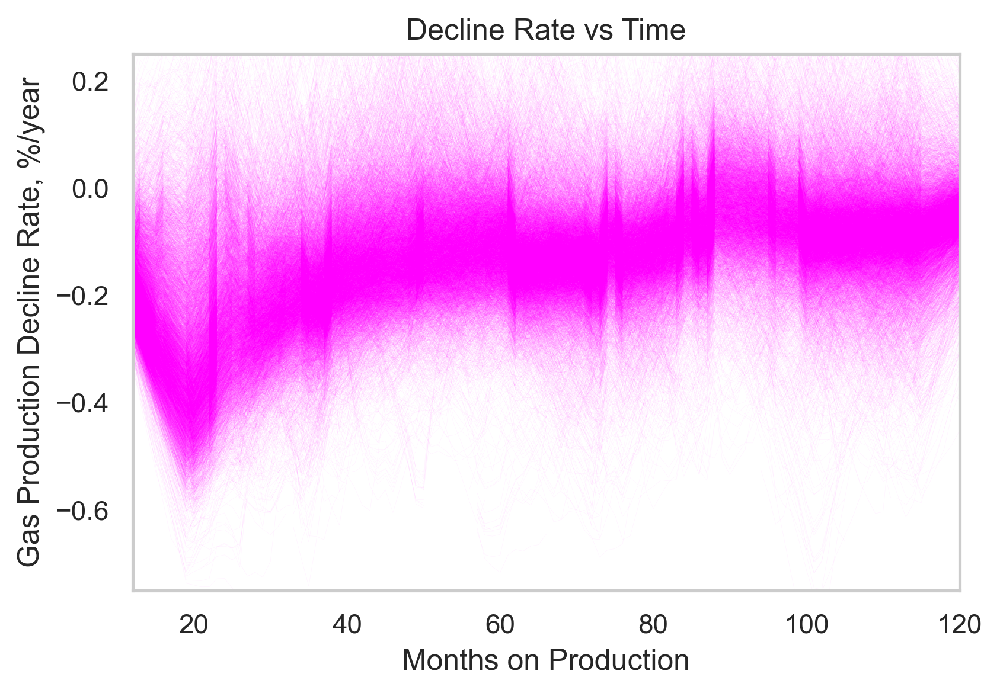

In [23]:
def decline_results(sim_results, step=12):
    decline_results = np.zeros([2, sim_results.ravel().shape[0]])
    for i, x in enumerate(sim_results):
        timestep = np.arange(1, len(x)+1)
        y = decline_rate(x, step)
        kernel_size = 12
        kernel = np.ones(kernel_size) / kernel_size
        y_conv = np.convolve(y, kernel, mode='same')
        decline_results[0, i*len(x):i*len(x)+len(x)] = timestep
        decline_results[1, i*len(x):i*len(x)+len(x)] = y_conv
        plt.plot(timestep, y_conv, lw=.15, alpha=0.05, color='magenta')
    plt.ylim(-.75, .25)
    plt.xlim(12, 120)
    plt.title('Decline Rate vs Time')
    plt.ylabel('Gas Production Decline Rate, %/year')
    plt.xlabel('Months on Production')
    return decline_results
decline_results = decline_results(sim_results, 12)
print('Decline rate output array shape:', decline_results.shape)
print('(Timestep, Decline rate)')

Derivative output array shape: (2, 1200000)
Timestep, d(decline rate)/d(timestep)


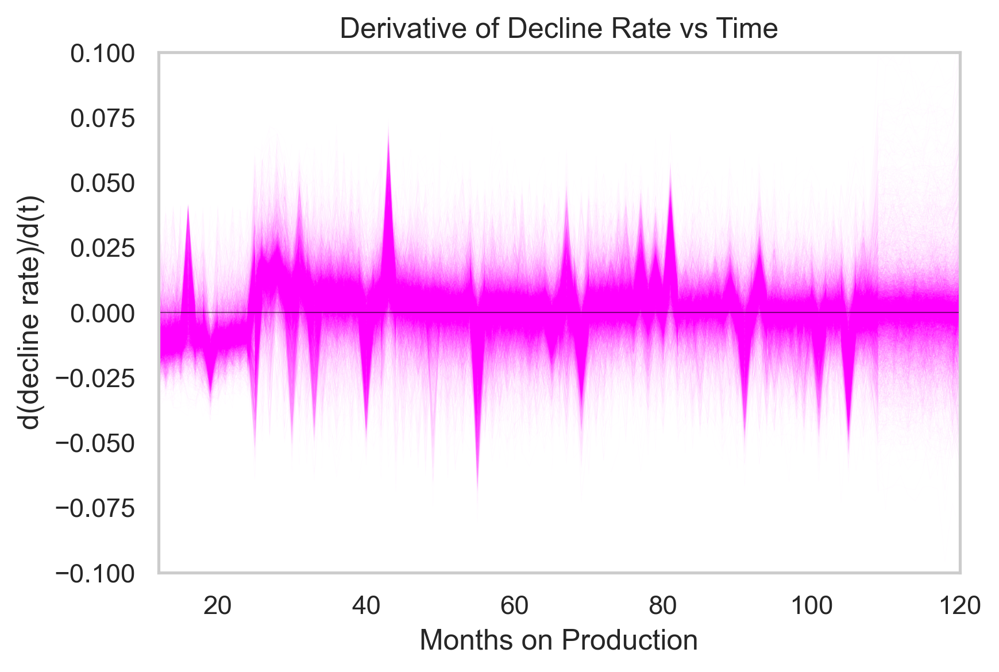

In [24]:
def deriv_decline_rate_time(sim_results, step=12):
    deriv_decline_results = np.zeros([2, sim_results.ravel().shape[0]])
    for i, x in enumerate(sim_results):
        timestep = np.arange(1, len(x)+1)
        dy = deriv(timestep, decline_rate(x, step=12))
        kernel_size = 24
        kernel = np.ones(kernel_size) / kernel_size
        dy_conv = np.convolve(dy, kernel, mode='same')
        deriv_decline_results[i:i+step] = 0.0
        deriv_decline_results[0, i*len(x):i*len(x)+len(x)] = timestep
        deriv_decline_results[1, i*len(x):i*len(x)+len(x)] = dy_conv
        plt.plot(timestep, dy_conv, lw=.15, alpha=0.02, color='magenta')
    plt.plot([0, 120], [0, 0], c='black', alpha=0.5, lw=0.5)
    plt.title('Derivative of Decline Rate vs Time')
    plt.ylabel('d(decline rate)/d(t)')
    plt.xlabel('Months on Production')
    plt.ylim(-.1, .1)
    plt.xlim(12, 120)
    
    return deriv_decline_results
deriv_decline_results = deriv_decline_rate_time(sim_results, 1)
print('Derivative output array shape:', deriv_decline_results.shape)
print('Timestep, d(decline rate)/d(timestep)')

In [25]:
def decline_prob(deriv_decline_results):
    timesteps = np.arange(1, deriv_decline_results[0].max()+1)
    decline_prob_array = np.zeros(len(timesteps))
    for idx, t in enumerate(timesteps):
        if t < 12:
            continue
        else:
            deriv_subset = deriv_decline_results[1, np.where(abs(deriv_decline_results[0]-t)<0.01)][0]
            terminal_decline = sum(abs(deriv_subset)<0.01)
        if len(deriv_subset) == 0:
            decline_prob_array[idx] = np.nan
        else:
            decline_prob_array[idx] = terminal_decline / len(deriv_subset)
    return np.array([timesteps, decline_prob_array])
decline_prob_array = decline_prob(deriv_decline_results)
print('Probability output array shape:', decline_prob_array.shape)
print('(Timesteps, Probability of terminal decline)')

Probability output array shape: (2, 120)
(Timesteps, Probability of terminal decline)


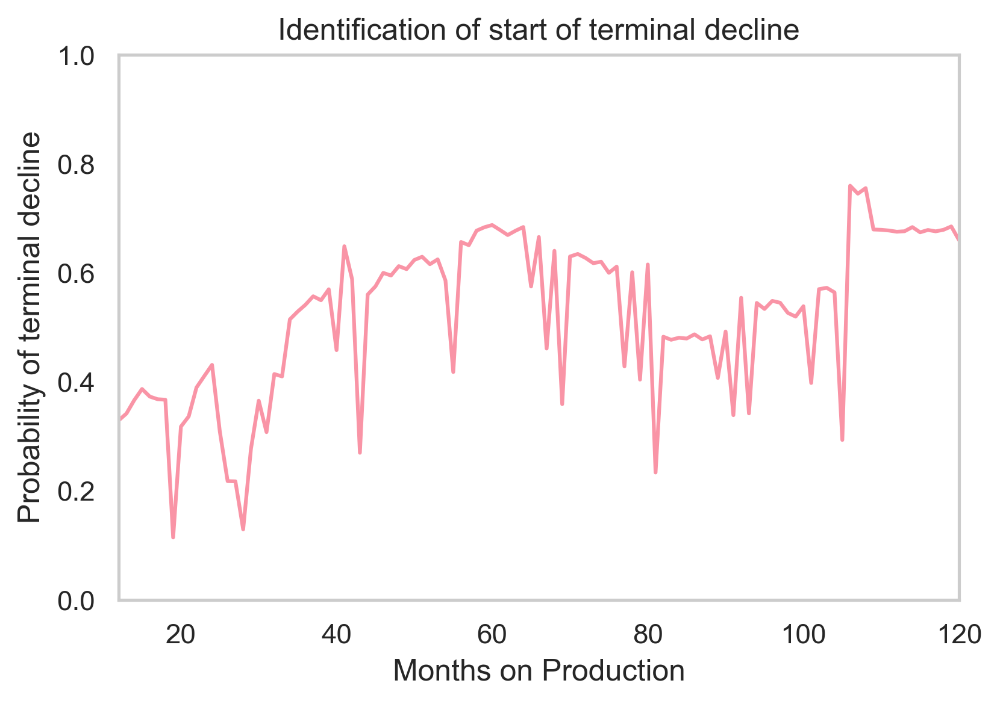

In [26]:
def plot_decline_prob(decline_prob_array, x_label='Months on Production', y_label='Probability of terminal decline',
                      plot_title='Identification of start of terminal decline'):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    plt.plot(decline_prob_array[0], decline_prob_array[1], alpha=0.75)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    ax.set_ylim(0, 1.0)
    ax.set_xlim(12, 120)
    plt.title(plot_title)
plot_decline_prob(decline_prob_array)

### Rate vs MBT Plot

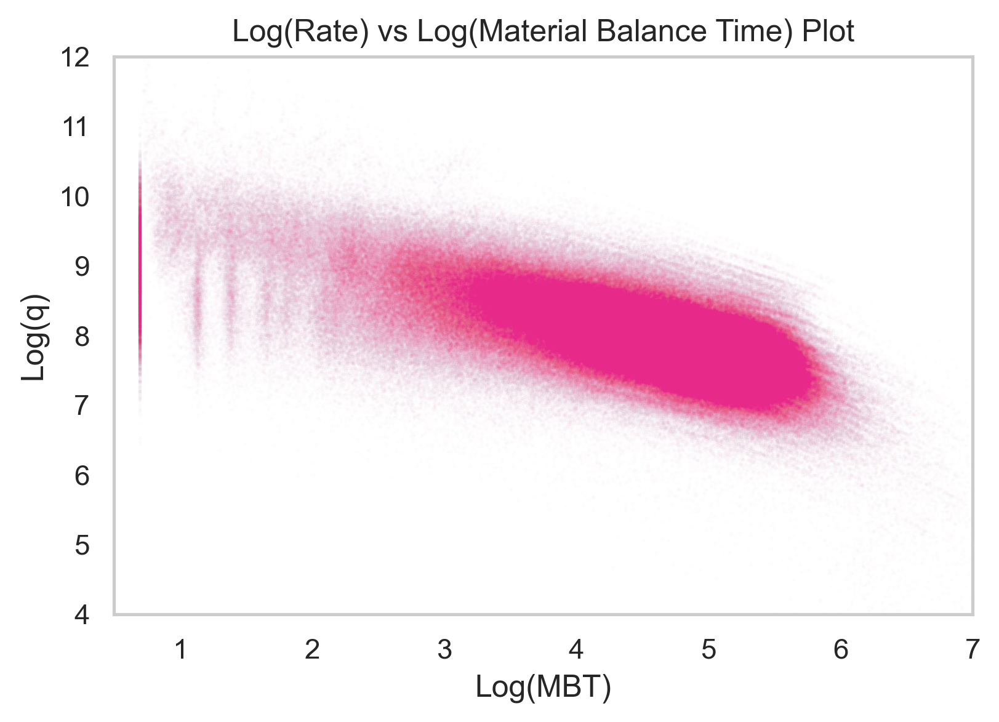

In [27]:
def logq_vs_logmbt(sim_results, x_label='Log(MBT)',
              y_label='Log(q)', plot_title='Log(Rate) vs Log(Material Balance Time) Plot'):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    for _, x in enumerate(sim_results):
        log_x = np.log1p(x.cumsum()/x)
        log_y = np.log1p(x)
        plt.scatter(log_x, log_y, alpha=0.01, color='#e7298a', s=0.15)
    plt.xlim(0.5, 7)
    plt.ylim(4, 12)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(plot_title)
logq_vs_logmbt(sim_results)

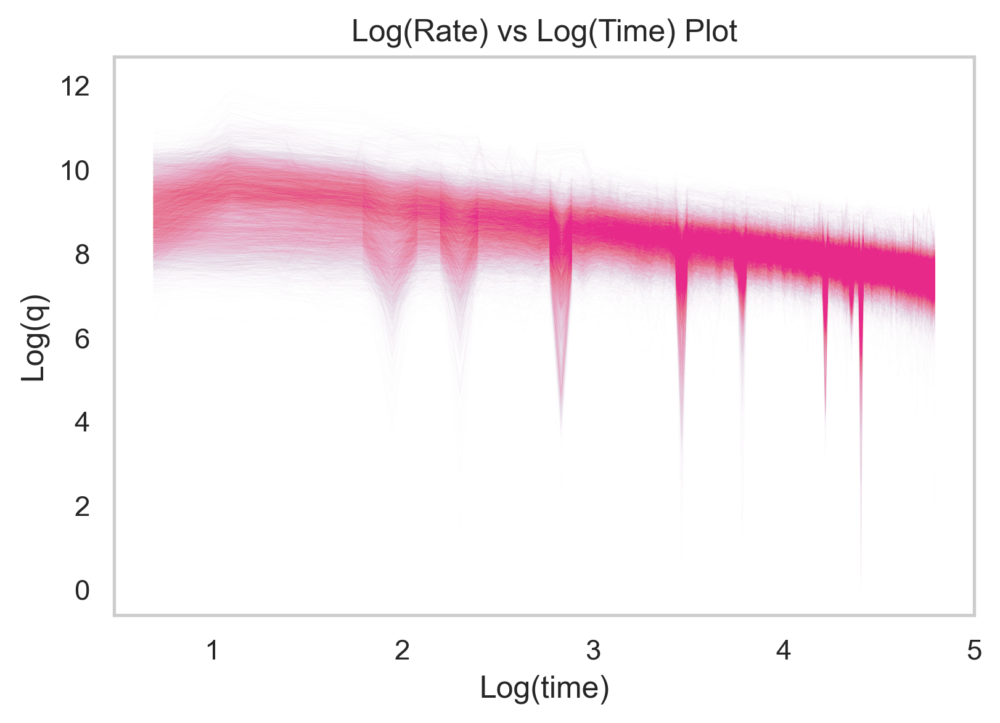

In [28]:
def logq_vs_logtime(sim_results, x_label='Log(time)',
              y_label='Log(q)', plot_title='Log(Rate) vs Log(Time) Plot'):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    for _, x in enumerate(sim_results):
        log_x = np.log1p(np.arange(1, len(x)+1))
        log_y = np.log1p(x)
        plt.plot(log_x, log_y, lw=0.15, alpha=0.01, color='#e7298a')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(plot_title)
logq_vs_logtime(sim_results)

### Rate vs Time Plot

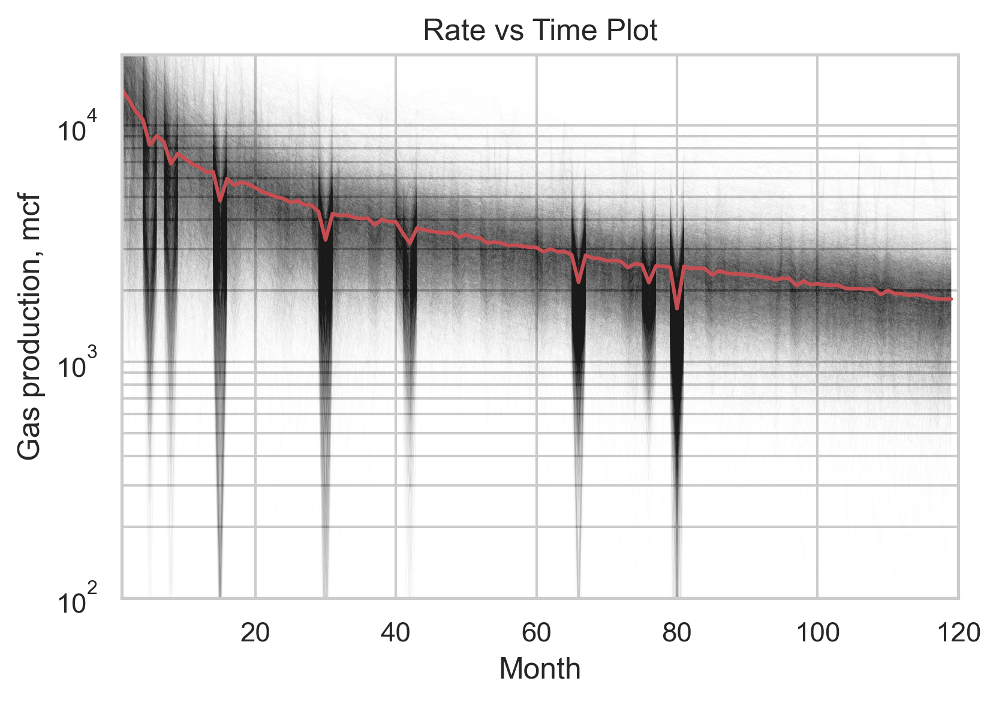

In [29]:
def q_vs_time(sim_results, x_label=data_dict['timestep'],
              y_label=data_dict['major'], plot_title='Rate vs Time Plot'):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    for _, x in enumerate(sim_results):
        plt.semilogy(np.arange(sim_results.shape[1]), x, lw=0.15, alpha=0.01, color='k')
    avg_curve = sim_results.mean(axis=0)
    plt.semilogy(np.arange(sim_results.shape[1]), avg_curve, alpha=1.0, color='r')
    ax.set_ylim(100,20000)
    ax.set_xlim(1, 120)
    plt.grid(b=True, which='both')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(plot_title)
q_vs_time(sim_results, x_label='Month', y_label='Gas production, mcf')

### Rate vs Cumulative Production Plot

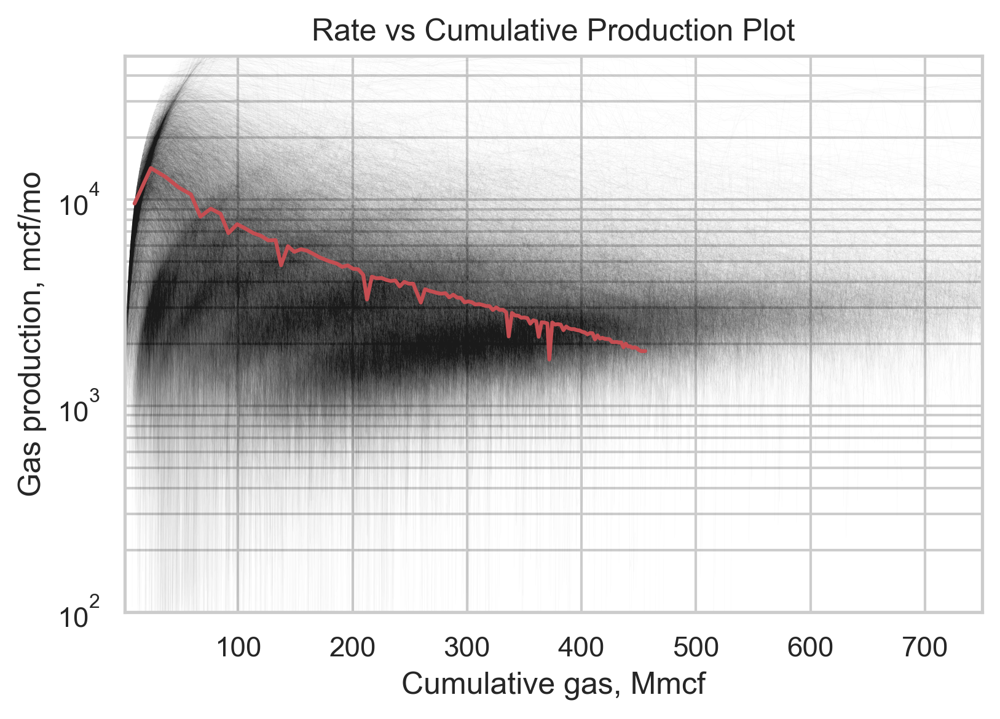

In [30]:
def q_vs_Q(sim_results, x_label=data_dict['timestep'],
           y_label=data_dict['major'], plot_title='Rate vs Cumulative Production Plot'):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    for _, x in enumerate(sim_results):
        plt.semilogy(x.cumsum()/1000, x, lw=0.15, alpha=0.02, color='k')
    avg_curve = sim_results.mean(axis=0)
    plt.semilogy(avg_curve.cumsum()/1000, avg_curve, alpha=1.0, color='r')
    ax.set_ylim(100,50000)
    ax.set_xlim(1, 750)
    plt.grid(b=True, which='both')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(plot_title)
q_vs_Q(sim_results, x_label='Cumulative gas, Mmcf', y_label='Gas production, mcf/mo')

### Cumulative Production vs Time Plot

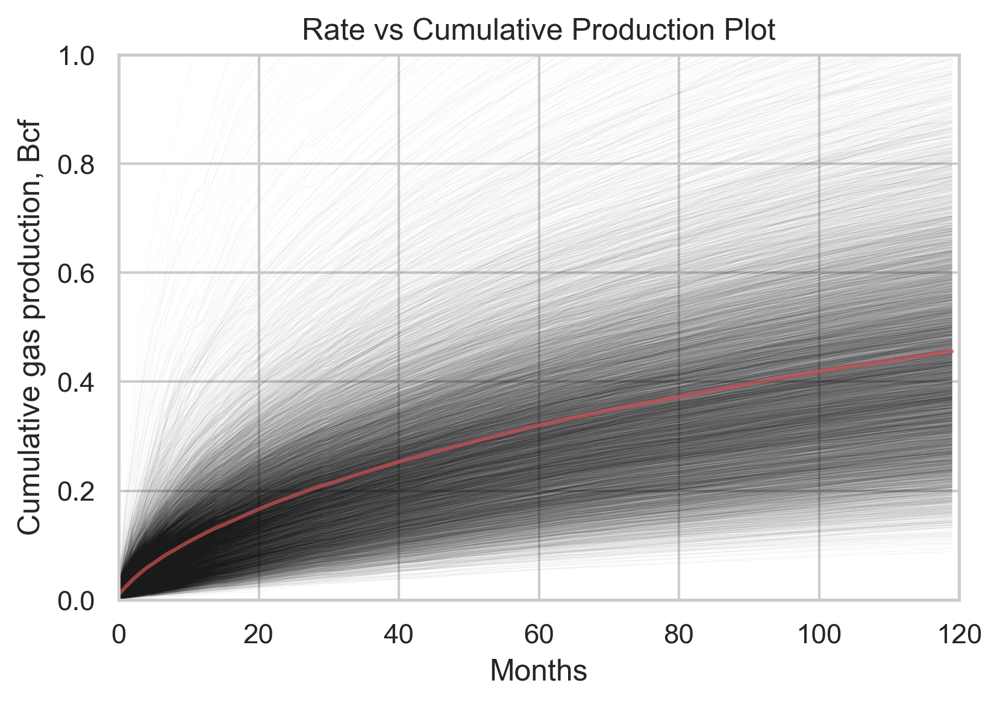

In [37]:
def Q_vs_time(sim_results, x_label=data_dict['major'],
              y_label=data_dict['timestep'], plot_title='Rate vs Cumulative Production Plot'):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    for _, x in enumerate(sim_results):
        plt.plot(np.arange(sim_results.shape[1]), x.cumsum()/1000000, alpha=0.05, lw=0.15, color='k')
    avg_curve = sim_results.mean(axis=0)
    plt.plot(np.arange(sim_results.shape[1]), avg_curve.cumsum()/1000000, alpha=0.75, color='r')
    ax.set_ylim(0, 1)
    ax.set_xlim(0, 120)
    plt.grid(b=True, which='both')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(plot_title)
Q_vs_time(sim_results, x_label='Months', y_label='Cumulative gas production, Bcf')